In [ ]:
! pip install -q kaggle

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
 ! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download -d 'carlosrunner/pizza-not-pizza'

 96% 97.0M/101M [00:03<00:00, 23.8MB/s]
100% 101M/101M [00:03<00:00, 27.1MB/s] 


In [ ]:
! unzip pizza-not-pizza.zip

Archive:  pizza-not-pizza.zip
  inflating: pizza_not_pizza/food101_subset.py  
  inflating: pizza_not_pizza/not_pizza/1005746.jpg  
  inflating: pizza_not_pizza/not_pizza/1009225.jpg  
  inflating: pizza_not_pizza/not_pizza/1012312.jpg  
  inflating: pizza_not_pizza/not_pizza/1018802.jpg  
  inflating: pizza_not_pizza/not_pizza/1020735.jpg  
  inflating: pizza_not_pizza/not_pizza/1027142.jpg  
  inflating: pizza_not_pizza/not_pizza/102839.jpg  
  inflating: pizza_not_pizza/not_pizza/1043233.jpg  
  inflating: pizza_not_pizza/not_pizza/1045400.jpg  
  inflating: pizza_not_pizza/not_pizza/104773.jpg  
  inflating: pizza_not_pizza/not_pizza/1050956.jpg  
  inflating: pizza_not_pizza/not_pizza/1054362.jpg  
  inflating: pizza_not_pizza/not_pizza/1062097.jpg  
  inflating: pizza_not_pizza/not_pizza/1066151.jpg  
  inflating: pizza_not_pizza/not_pizza/1070772.jpg  
  inflating: pizza_not_pizza/not_pizza/1070867.jpg  
  inflating: pizza_not_pizza/not_pizza/107499.jpg  
  inflating: pizza_not_

# **Pizza Or Not Pizza Classifier - CNN**

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms

import numpy as np
import matplotlib.pyplot as plt

In [ ]:
%matplotlib inline

## **Data Collection & Processing**

In [ ]:
transform = transforms.Compose(
    [
        transforms.RandomResizedCrop(386),
        transforms.ToTensor()
    ]
)

In [ ]:
data = datasets.ImageFolder(
    "/content/pizza_not_pizza",
    transform = transform
)

In [ ]:
train_data, test_data = random_split(data, (0.8, 0.2))

In [ ]:
train_loader = DataLoader(train_data, batch_size = 10, shuffle = True)
test_loader = DataLoader(test_data, batch_size = 10, shuffle = True)

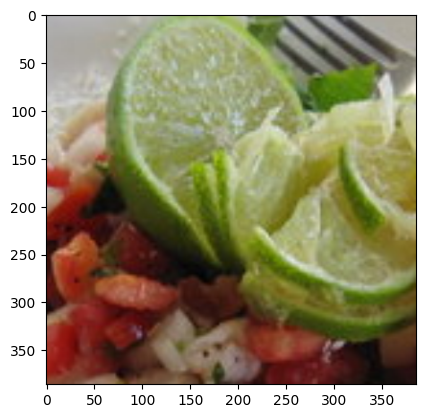

In [ ]:
plt.imshow(train_loader.dataset[22][0].detach().numpy().transpose((1, 2, 0)))

In [ ]:
train_loader.dataset[22][1]

0

## **Playing out with Convolution & Pooling layers!**

In [ ]:
conv1 = nn.Conv2d(3, 6, 3, 1)
conv2 = nn.Conv2d(6, 16, 3, 1)
conv3 = nn.Conv2d(16, 32, 3, 1)


X = F.relu(conv1(train_loader.dataset[22][0]))
X = F.max_pool2d(X, 2, 2)
X = F.relu(conv2(X))
X = F.max_pool2d(X, 2, 2)
X = F.relu(conv3(X))
X = F.max_pool2d(X, 2, 2)

In [ ]:
X.shape

torch.Size([32, 46, 46])

In [ ]:
fig = plt.figure(figsize = (200, 200))

for i in range(32):
    fig.add_subplot(8, 4, i + 1)
    plt.imshow(X[i].detach().numpy())

## **Creating The Model**

In [ ]:
class CNN(nn.Module):

  def __init__(self):
    super().__init__()

    self.conv1 = nn.Conv2d(3, 6, 3, 1)
    self.conv2 = nn.Conv2d(6, 16, 3, 1)
    self.conv3 = nn.Conv2d(16, 32, 3, 1)

    self.fc1 = nn.Linear(32 * 46 * 46, 120)
    self.fc2 = nn.Linear(120, 84)
    self.fc3 = nn.Linear(84, 84)
    self.fc4 = nn.Linear(84, 84)
    self.fc5 = nn.Linear(84, 2)

  def forward(self, X):
    X = F.relu(self.conv1(X))
    X = F.max_pool2d(X, 2, 2)
    X = F.relu(self.conv2(X))
    X = F.max_pool2d(X, 2, 2)
    X = F.relu(self.conv3(X))
    X = F.max_pool2d(X, 2, 2)

    X = X.view(-1, 32 * 46 * 46)

    X = F.relu(self.fc1(X))
    X = F.relu(self.fc2(X))
    X = F.relu(self.fc3(X))
    X = F.relu(self.fc4(X))
    X = self.fc5(X)

    return F.log_softmax(X, dim = 1)

In [ ]:
torch.manual_seed(71)

In [ ]:
Model = CNN()

In [ ]:
if torch.cuda.is_available():
  Model.to('cuda:0')
  device = 'cuda:0'
  print('cuda')

else:
  Model.to('cpu')
  device = 'cpu'
  print('cpu')

cuda


In [ ]:
criterion = nn.CrossEntropyLoss()# Loss Function
optimizer = torch.optim.Adam(Model.parameters(), lr = 0.001)# Optimizer

## **Training the Model!**

In [ ]:
import time

start_time = time.time()

epochs : int = 10
train_losses : int = []
test_losses : int = []
train_correct : int = []
test_correct : int = []

train_corr = 0
test_corr = 0

i : int = 1
while i <= epochs:
  train_corr = 0

  for b, (X_train, y_train) in enumerate(train_loader):
    b += 1

    y_pred = Model(X_train.to(device))
    loss = criterion(y_pred, y_train.to(device))
    predicted = torch.max(y_pred.data, 1)[1]

    batch_corr : int = (predicted == y_train.to(device)).sum()
    train_corr += batch_corr

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if (b + 1) % 100 == 0:
      print(f"Epoch : {i}, Loss : {loss.item()}, Accuracy : {test_corr / len(test_data)}")

  train_losses.append(loss)
  train_correct.append(train_corr)

  test_corr = 0

  with torch.no_grad():
    for b, (X_test, y_test) in enumerate(test_loader):
      y_val = Model(X_test.to(device))
      predicted = torch.max(y_val.data, 1)[1]
      test_corr += (predicted == y_test.to(device)).sum()

  loss = criterion(y_val, y_test.to(device))
  test_losses.append(loss)
  test_correct.append(test_corr)

  i += 1

current_time = time.time()
print(f"Time taken to train the model : {current_time - start_time}")

Epoch : 1, Loss : 0.42992544174194336, Accuracy : 0.0
Epoch : 2, Loss : 0.4183517098426819, Accuracy : 0.7353689670562744
Epoch : 3, Loss : 0.14163394272327423, Accuracy : 0.7811704874038696
Epoch : 4, Loss : 0.23310527205467224, Accuracy : 0.7557252049446106
Epoch : 5, Loss : 0.4866073727607727, Accuracy : 0.707379162311554
Epoch : 6, Loss : 0.4376845955848694, Accuracy : 0.7480915784835815
Epoch : 7, Loss : 0.4543311595916748, Accuracy : 0.7277354001998901
Epoch : 8, Loss : 0.5248536467552185, Accuracy : 0.7531806826591492
Epoch : 9, Loss : 0.33913469314575195, Accuracy : 0.7404580116271973
Epoch : 10, Loss : 0.5732788443565369, Accuracy : 0.7251908183097839
Time taken to train the model : 150.3349974155426


## **Testing The Model**

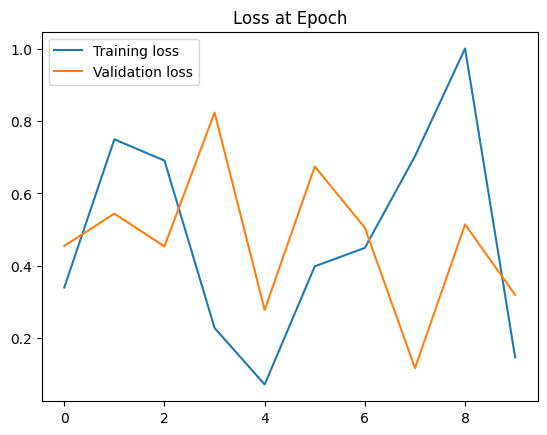

In [60]:
# plotting the results

#train_losses = [tl.item() for tl in train_losses]
#test_losses = [tl.item() for tl in test_losses]

plt.plot(np.array(train_losses), label = "Training loss")
plt.plot(np.array(test_losses), label = "Validation loss")
plt.title("Loss at Epoch")
plt.legend()

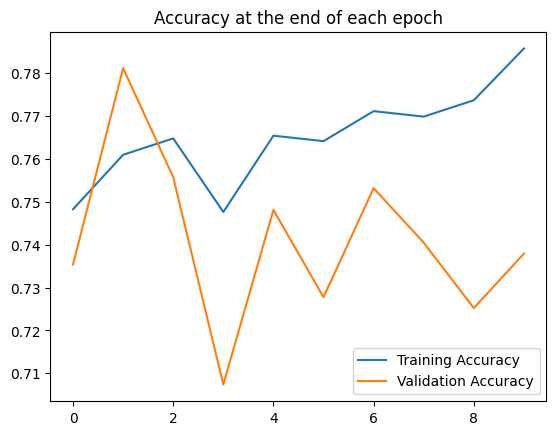

In [70]:
# plotting the results

#train_correct = [tl.item() for tl in train_correct]
#test_correct = [tl.item() for tl in test_correct]

plt.plot([t / len(train_data) for t in train_correct], label = "Training Accuracy")
plt.plot([t / len(test_data) for t in test_correct], label = "Validation Accuracy")
plt.title("Accuracy at the end of each epoch")
plt.legend()

In [ ]:
with torch.no_grad():
  correct = 0
  for X_test, y_test in DataLoader(test_data, batch_size = 10000, shuffle = False):
    y_pred = Model(X_test.to(device))
    predicted = torch.max(y_pred, 1)[1]
    correct += (predicted == y_test.to(device)).sum()

In [ ]:
# Accuracy
print(f"Accuracy : {correct.item() / len(test_data) * 100}%")

Accuracy : 72.51908396946564%


In [ ]:
fig = plt.figure(figsize = (120, 120))

for i in range(25):
    fig.add_subplot(5, 5, i + 1)
    plt.imshow(test_loader.dataset[i + 50][0].detach().numpy().transpose(1, 2, 0))

    with torch.no_grad():
        y_pred = Model(test_loader.dataset[i + 50][0].to(device))
        y_pred_text = "Actual Value : " + str(
            ["Pizza" if test_loader.dataset[i + 50][1] else "Not Pizza"][0]
        ) + "\nPredicted : " + str(
            ['Pizza' if torch.max(y_pred, 1)[1] else 'Not Pizza'][0]
        )

    plt.title(y_pred_text, fontdict = {"fontsize" : 100})

## **Saving The Model!**

In [71]:
torch.save(Model.state_dict(), "PizzaOrNotPizza_CNN_Model.pt")